# Humanoid Env

In [1]:
import gymnasium as gym
import numpy as np

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
from collections import deque
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
import tensorflow_probability as tfp

# to make this notebook's output stable across runs
np.random.seed(42)
tf.random.set_seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# To get smooth animations
import matplotlib.animation as animation
mpl.rc('animation', html='jshtml')

In [2]:
# Crear el entorno Humanoid
env = gym.make("Walker2d-v4", render_mode='human')

In [3]:
print("Action Space {}". format(env.action_space))
print("State Space {}.". format(env.observation_space))

env.close()

Action Space Box(-1.0, 1.0, (6,), float32)
State Space Box(-inf, inf, (17,), float64).


## Q-learning & Double Q-learning

No es posible hacer Q-learning ni double q-learning debido a la dificultad del environment y su carácter continuo. Es necesario deep reinforcement learning, para establecer la policy o value function mediante una red neuronal.

## Deep Reinforcement Learning

El Deep Reinforcement Learning surge como una solución a la dificultad de aplicar métodos de Reinforcement Learning en entornos continuos y de alta dimensionalidad. En estos casos, los métodos tradicionales no funcionan correctamente y sufren para aprender políticas óptimas debido a la complejidad del espacio de estados y acciones. DRL utiliza redes neuronales profundas para representar y aproximar funciones de valor, lo que permite abordar este tipo de entornos. A continuación se utilizan varios métodos de DRL para intentar realizar un aprendizaje correcto en entornos continuos.

### Deep Q-learning

Primero se construye la red neuronal usada para este caso.

In [4]:
# Building of DQN

keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

input_shape = env.observation_space.shape
n_outputs = env.action_space.shape[0]

model = keras.models.Sequential([
    keras.layers.Dense(64, activation="elu", input_shape=input_shape),
    keras.layers.Dense(64, activation="elu"),
    keras.layers.Dense(32, activation="elu"),
    keras.layers.Dense(n_outputs)
])

c:\Users\juanl\anaconda3\envs\ML2\Lib\site-packages\keras\src\layers\core\dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Tras esto, se definen las funciones necesarias, como la selección de acción a ejecutar, la función de entrenamiento o la de experiencias.

In [4]:
# Action selection policy

def epsilon_greedy_policy(state, epsilon=0):
    if np.random.rand() < epsilon:
        action = np.random.uniform(env.action_space.low, env.action_space.high, size=env.action_space.shape)
        return action
    else:
        Q_values = model.predict(state[np.newaxis])
        return Q_values[0]

    
# Function to sample experiences

def sample_experiences(batch_size):
    indices = np.random.randint(len(replay_memory), size=batch_size)
    batch = [replay_memory[index] for index in indices]
    states, actions, rewards, next_states, dones = [
        np.array([experience[field_index] for experience in batch])
        for field_index in range(5)]
    return states, actions, rewards, next_states, dones


# Function that use the DQN to play one step:

def play_one_step(env, state, epsilon):
    action = epsilon_greedy_policy(state, epsilon)
    next_state, reward, done, tr,info = env.step(action)
    replay_memory.append((state, action, reward, next_state, done))
    return next_state, reward, done, info


#Function to train the DQN performing a training step:

def training_step(batch_size):
    experiences = sample_experiences(batch_size)
    states, actions, rewards, next_states, dones = experiences
    next_Q_values = model.predict(next_states)
    max_next_Q_values = np.max(next_Q_values, axis=1)
    target_Q_values = (rewards +
                       (1 - dones) * discount_rate * max_next_Q_values)
    target_Q_values = target_Q_values.reshape(-1, 1)
    mask = tf.one_hot(actions, n_outputs)
    
    with tf.GradientTape() as tape:
        all_Q_values = model(states)
        Q_values = tf.matmul(all_Q_values, tf.cast(mask, tf.float32))
        loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))
    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))

Por último, antes del entrenamiento, se definen las variables a optimizar.

In [6]:
rewards = [] 
best_score = 0

# Replay memory

replay_memory = deque(maxlen=2000)

batch_size = 32
discount_rate = 0.95
optimizer = keras.optimizers.Adam(learning_rate=1e-3)
loss_fn = tf.keras.losses.MeanSquaredError(reduction="none", name="mean_squared_error")

n_episodes = 600

Se finaliza con el entrenamiento del modelo.

In [7]:
for episode in range(n_episodes):
    print("Episode:   ", episode)
    obs = env.reset() # reset the environment to a new random state
    obs=obs[0]
    for step in range(200):
        epsilon = max(1 - episode / 500, 0.01)
        obs, reward, done, info = play_one_step(env, obs, epsilon)
        if done:
            #print("done:   ", done)
            break
    rewards.append(step) # Not shown 
    if step >= best_score: # Not shown
        best_weights = model.get_weights() # Not shown
        best_score = step # Not shown
    print("\rEpisode: {}, Steps: {}, eps: {:.3f}".format(episode, step + 1, epsilon), end="") # Not shown
    if episode > 50:
        training_step(batch_size)

model.set_weights(best_weights)

Episode:    0
Episode: 0, Steps: 20, eps: 1.000Episode:    1
Episode: 1, Steps: 22, eps: 0.998Episode:    2
Episode: 2, Steps: 12, eps: 0.996Episode:    3
Episode: 3, Steps: 14, eps: 0.994Episode:    4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
Episode: 4, Steps: 21, eps: 0.992Episode:    5
Episode: 5, Steps: 12, eps: 0.990Episode:    6
Episode: 6, Steps: 25, eps: 0.988Episode:    7
Episode: 7, Steps: 13, eps: 0.986Episode:    8
Episode: 8, Steps: 46, eps: 0.984Episode:    9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Episode: 9, Steps: 36, eps: 0.982Episode:    10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Episode: 10, Steps: 22, eps: 0.980Episode:    11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Episode: 11, Steps: 15, eps: 0.978Episode:    12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Episode: 12, Steps: 37, eps: 0.976Episode:    13
Episode: 13, Steps: 10, eps: 0.974Episode:    14
Episode: 14, Steps: 28, eps: 0.972Episode:    15
Episode: 15, Steps: 17, eps: 0.970Episode:    16
Episode: 16, Steps: 28, eps: 0.

A continuación se visualizan los resultados de recompensas y el decrecimiento de epsilon a lo largo de las ejecuciones.

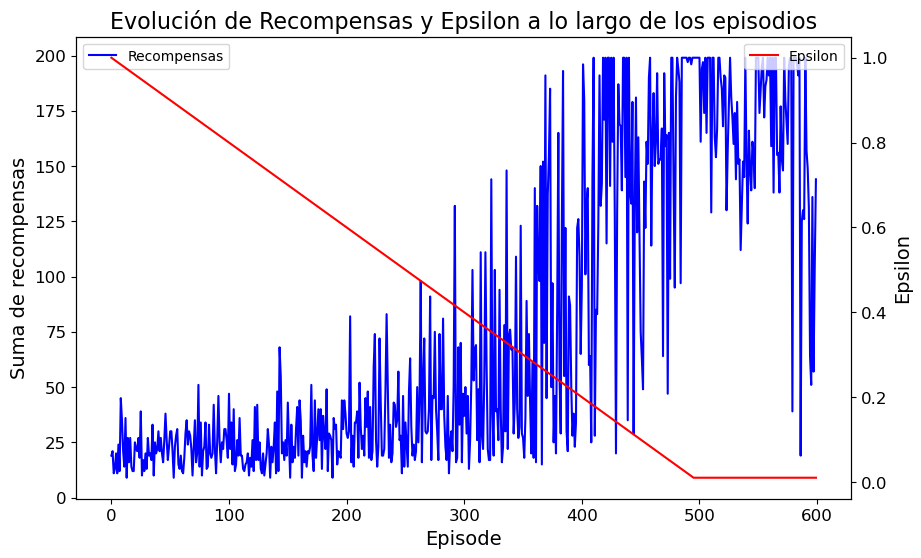

In [8]:
import matplotlib.pyplot as plt

epsilons = [max(1 - episode / 500, 0.01) for episode in range(n_episodes)]

plt.figure(figsize=(10, 6))

# Plot de las recompensas
plt.plot(rewards, label="Recompensas", color='blue')
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Suma de recompensas", fontsize=14)
plt.legend(loc='upper left')

# Crear un eje secundario para el valor de epsilon
ax = plt.gca().twinx()
ax.plot(epsilons, label="Epsilon", color='red')
ax.set_ylabel("Epsilon", fontsize=14)
ax.legend(loc='upper right')

plt.title("Evolución de Recompensas y Epsilon a lo largo de los episodios", fontsize=16)
plt.show()


In [9]:
env.close()

Como podemos ver, a lo largo de los episodios ha sido siendo más capaz de mantenerse cerca del máximo de recompensas, por lo que aumentamos el número de steps e iteraciones, intentando ver hasta dónde puede aprender.

Se repiten los pasos, en ese caso con una red distinta y una definición más compleja de epsilon.

In [4]:
env = gym.make("Walker2d-v4", render_mode='human')

In [5]:
keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

input_shape = env.observation_space.shape
n_outputs = env.action_space.shape[0]


model = keras.models.Sequential([
    keras.layers.Dense(128, activation="elu", input_shape=input_shape),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(64, activation="elu"),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(32, activation="elu"),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(n_outputs)
])

c:\Users\juanl\anaconda3\envs\ML2\Lib\site-packages\keras\src\layers\core\dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [6]:
rewards = [] 
best_score = 0

batch_size = 32
discount_rate = 0.95
optimizer = keras.optimizers.Adam(learning_rate=1e-3)
loss_fn = keras.losses.mean_squared_error

initial_epsilon = 1.0
final_epsilon = 0.05
epsilon_decay_episodes = 2000
epsilon_decay_steps = 1500

replay_memory = deque(maxlen=1500)

n_episodes = 3000
n_steps = 1000

In [9]:
for episode in range(n_episodes):
    print("Episode:   ", episode)
    obs = env.reset() # reset the environment to a new random state
    obs=obs[0]
    epsilon = max(final_epsilon, initial_epsilon - episode / epsilon_decay_episodes)
    for step in range(n_steps):
        epsilon = max(final_epsilon, epsilon - step / epsilon_decay_steps)
        obs, reward, done, info = play_one_step(env, obs, epsilon)
        if done:
            #print("done:   ", done)
            break
    rewards.append(step) # Not shown 

    if step >= best_score: # Not shown
        best_weights = model.get_weights() # Not shown
        best_score = step # Not shown
    print("\rEpisode: {}, Steps: {}, eps: {:.3f}".format(episode, step + 1, epsilon), end="") # Not shown
    if episode > 75:
        training_step(batch_size)

model.set_weights(best_weights)

Episode:    0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
Episode: 0, Steps: 19, eps: 0.886Episode:    1
Episode: 1, Steps: 9, eps: 0.976Episode:    2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Episode: 2, Steps: 24, eps: 0.815Episode:    3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Episode: 3, Steps: 20, eps: 0.872Episode:    4
Episode: 4, Steps: 23, eps: 0.829Episode:    5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Episode: 5, Steps: 17, eps: 0.907Episode:    6
Episode: 6, Steps: 21, eps: 0.857Episode:    7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Episode: 7, Steps: 14, eps: 0.936Episode:    8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Episode: 8, Steps: 37, eps: 0.552Episode:    9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Episode: 9, Steps: 19, eps: 0.881Episode:    10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Episode: 10, Steps: 14

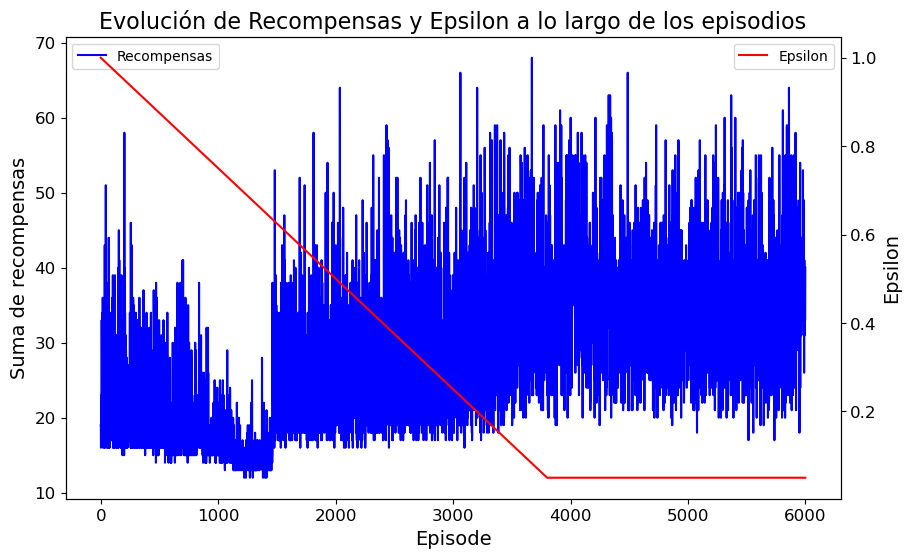

In [ ]:
epsilons = [max(final_epsilon, initial_epsilon - episode / epsilon_decay_episodes) for episode in range(n_episodes)]

plt.figure(figsize=(10, 6))

# Plot de las recompensas
plt.plot(rewards, label="Recompensas", color='blue')
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Suma de recompensas", fontsize=14)
plt.legend(loc='upper left')

# Crear un eje secundario para el valor de epsilon
ax = plt.gca().twinx()
ax.plot(epsilons, label="Epsilon", color='red')
ax.set_ylabel("Epsilon", fontsize=14)
ax.legend(loc='upper right')

plt.title("Evolución de Recompensas y Epsilon a lo largo de los episodios", fontsize=16)
plt.show()

In [ ]:
env.close()

A pesar de la mejoría, se puede observar la gran cantidad de episodios usados y la imposibilidad de conseguir un entrenamiento exitoso, finalizando en mínimos locales y sin poder mejorar más la recompensa. Por ello, se exploran métodos más complejos de Deep Reinforcement Learning.

### Double Deep Q Network

In [ ]:
env = gym.make("Ant-v4", render_mode='human') #Walker2d-v4

In [5]:
# Building of Double-DQN

keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

input_shape = env.observation_space.shape
n_outputs = env.action_space.shape[0]

model = keras.models.Sequential([
    keras.layers.Dense(64, activation="elu", input_shape=input_shape),
    keras.layers.Dense(64, activation="elu"),
    keras.layers.Dense(32, activation="elu"),
    keras.layers.Dense(n_outputs)
])

target = keras.models.clone_model(model)  # NEW It is a clone of the online model
target.set_weights(model.get_weights()) 

d:\Anaconda\envs\ML\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [6]:
# Action selection policy

from collections import deque

replay_memory = deque(maxlen=2000)

def epsilon_greedy_policy(state, epsilon=0):
    if np.random.rand() < epsilon:
        action = np.random.uniform(env.action_space.low, env.action_space.high, size=env.action_space.shape)
        return action
    else:
        Q_values = model.predict(state[np.newaxis])
        return Q_values[0]

    
# Function to sample experiences

def sample_experiences(batch_size):
    indices = np.random.randint(len(replay_memory), size=batch_size)
    batch = [replay_memory[index] for index in indices]
    states, actions, rewards, next_states, dones = [
        np.array([experience[field_index] for experience in batch])
        for field_index in range(5)]
    return states, actions, rewards, next_states, dones



def play_one_step(env, state, epsilon):
    action = epsilon_greedy_policy(state, epsilon)
    next_state, reward, done, tr,info = env.step(action)
    replay_memory.append((state, action, reward, next_state, done))
    return next_state, reward, done, info


#Function to train the DQN performing a training step:

batch_size = 32
discount_rate = 0.95
optimizer = keras.optimizers.Adam(learning_rate=1e-2)
loss_fn = tf.keras.losses.MeanSquaredError(reduction="none", name="mean_squared_error")

def training_step(batch_size):
    experiences = sample_experiences(batch_size)
    states, actions, rewards, next_states, dones = experiences
    print(f"states: {states.shape}, actions: {actions.shape}, rewards: {rewards.shape}, next_states: {next_states.shape}, dones: {dones.shape}")
    #next_Q_values = model.predict(next_states)  # ORIGINAL DQN
    next_Q_values = target.predict(next_states)  # NEW  Using the target model instead the online model 
    max_next_Q_values = np.max(next_Q_values, axis=1)
    target_Q_values = (rewards +
                       (1 - dones) * discount_rate * max_next_Q_values)
    target_Q_values = target_Q_values.reshape(-1, 1)
    mask = tf.one_hot(np.argmax(actions, axis=1), n_outputs)
    with tf.GradientTape() as tape:
        all_Q_values = model(states)   # Use of the online model
        Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
        loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))
    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))

In [10]:
np.random.seed(42)
tf.random.set_seed(42)

rewards = [] 
best_score = 0
n_episodes = 600

In [13]:
for episode in range(n_episodes):
    obs = env.reset() 
    obs = obs[0]
    for step in range(200):
        epsilon = max(1 - episode / 500, 0.01)
        obs, reward, done, info = play_one_step(env, obs, epsilon)
        if done:
            break
    rewards.append(step) # Not shown in the book
    print(step)
    print(rewards)
    if step >= best_score: # Not shown
        best_weights = model.get_weights() # Not shown
        best_score = step # Not shown
    # print("\rEpisode: {}, Steps: {}, eps: {:.3f}".format(episode, step + 1, epsilon), end="") # Not shown
    #print(" Episodio vvvv", episode)
    if episode > 50:
        #print(" batch size vvvv", batch_size)      
        training_step(batch_size)
    if episode % 50 == 0:     ## Updating weights
        target.set_weights(model.get_weights())

model.set_weights(best_weights)

19
[19]
17
[19, 17]
19
[19, 17, 19]
16
[19, 17, 19, 16]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
23
[19, 17, 19, 16, 23]
21
[19, 17, 19, 16, 23, 21]
16
[19, 17, 19, 16, 23, 21, 16]
17
[19, 17, 19, 16, 23, 21, 16, 17]
26
[19, 17, 19, 16, 23, 21, 16, 17, 26]
29
[19, 17, 19, 16, 23, 21, 16, 17, 26, 29]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
18
[19, 17, 19, 16, 23, 21, 16, 17, 26, 29, 18]
39
[19, 17, 19, 16, 23, 21, 16, 17, 26, 29, 18, 39]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
20
[19, 17, 19, 16, 23, 21, 16, 17, 26, 29, 18, 39, 20]
21
[19, 17, 19, 16, 23, 21, 16, 17, 26, 29, 18, 39, 20, 21]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
28
[19, 17, 19, 16, 23, 21, 16, 17, 26, 29, 18, 39, 20, 21, 28]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
26
[19, 17, 19, 16, 23, 21, 16, 17, 26, 29, 18, 39, 20, 21, 28, 26]
33
[19, 17, 19, 16, 23, 21, 16, 17, 26, 29, 18, 39, 20, 21, 28, 26, 33]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
16
[19, 17, 19, 16, 23, 21, 16, 17, 26, 29, 18, 39, 20, 21, 28, 26, 33, 16]
31
[19, 17, 19, 

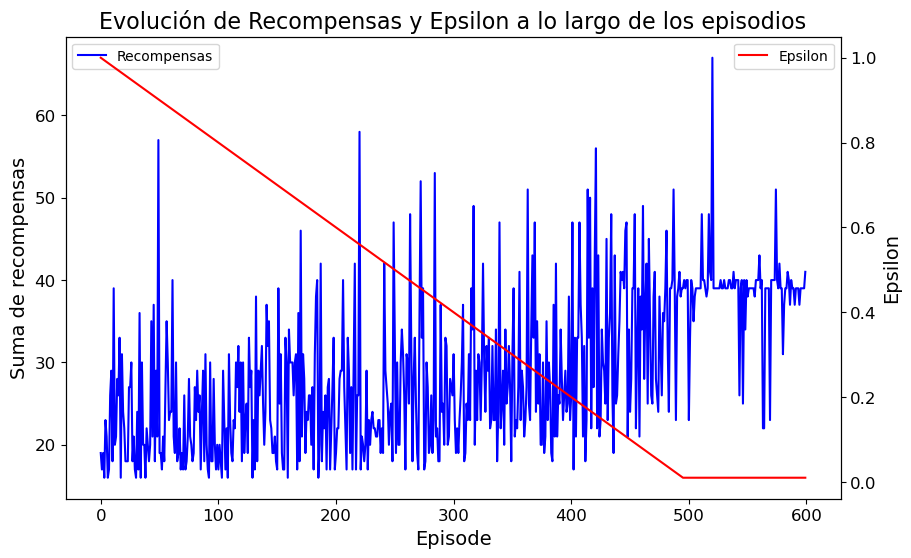

In [14]:
import matplotlib.pyplot as plt

epsilons = [max(1 - episode / 500, 0.01) for episode in range(n_episodes)]

plt.figure(figsize=(10, 6))

# Plot de las recompensas
plt.plot(rewards, label="Recompensas", color='blue')
plt.xlabel("Episode", fontsize=14)
plt.ylabel("Suma de recompensas", fontsize=14)
plt.legend(loc='upper left')

# Crear un eje secundario para el valor de epsilon
ax = plt.gca().twinx()
ax.plot(epsilons, label="Epsilon", color='red')
ax.set_ylabel("Epsilon", fontsize=14)
ax.legend(loc='upper right')

plt.title("Evolución de Recompensas y Epsilon a lo largo de los episodios", fontsize=16)
plt.show()

In [ ]:
env.close()

### Dueling Deep Q Network

### Policy Gradient Methods 

Los métodos de Policy Gradient son esencialmente diferentes a los algoritmos previamente entrenados. En este caso, la información sobre el entrenamiento no se guardará en una matriz Q a partir de la cual se tomará la decisión sobre las acciones a realizar por el humanoide. En cambio, la información sobre la capacitación se captura en una distribución de probabilidad. El espacio de acción del entorno humanoide está compuesto por 17 acciones, de esta manera, se entrenará una función de distribución de manera que los valores de la distribución con una recompensa alta dado un estado se hagan más probables, y aquellos con menos recompensas se reducirán en probabilidad mediante retropropagación.

De esta forma, la red neuronal que será entrenada tendrá un estado (matriz de longitud 376) y generará los parámetros de distribución de cada una de las 17 acciones posibles. Se asumirá que la distribución de las acciones es gaussiana, por lo que los parámetros estimados serán la media y la desviación estándar.

In [1]:
import tensorflow as tf
from tensorflow.keras.layers import Dense

class PolicyNetwork(tf.keras.Model):
    # The neural network will have two additional dense layers
    def __init__(self, n_actions):
        super(PolicyNetwork, self).__init__()
        self.dense1 = Dense(128, activation='relu')
        self.dense2 = Dense(256, activation='relu')  # New dense layer
        self.dense3 = Dense(128, activation='relu')  # New dense layer
        self.mu = Dense(n_actions, activation='tanh')
        self.sigma = Dense(n_actions, activation='softplus')

    def call(self, state):
        x = self.dense1(state)
        x = self.dense2(x)  # Passing through the new dense layer
        x = self.dense3(x)  # Passing through the new dense layer
        mu = self.mu(x) * 2.0  # Scale output to match action space range
        sigma = self.sigma(x) + 1e-5  # Add small value to avoid zero
        return mu, sigma


La función de pérdida del modelo con el que se entrenará la red es especial para el algoritmo Reinforce. Se define como la probabilidad logarítmica de cada acción devuelta por nn multiplicado por la recompensa. Esta recompensa no sólo incluye la recompensa instantánea en un paso determinado, sino también las posibles recompensas futuras.

Esta multiplicación puede entenderse como una recompensa futura esperada al ejecutar una acción determinada, sólo que en lugar de utilizar las probabilidades de la acción, se utilizan las probabilidades logarítmicas. Como el algoritmo tensorflow está codificado para minimizar la pérdida, usaremos la opuesta de la función explicada anteriormente.

In [2]:
def sample_action(mu, sigma):
    return np.random.normal(mu, sigma)

def discounted_rewards(rewards, gamma=0.99):
    #It not only calculates the future rewards but also normalizes the output.
    discounted_r = np.zeros_like(rewards, dtype=np.float32)
    running_add = 0
    for t in reversed(range(len(rewards))):
        running_add = running_add * gamma + rewards[t]
        discounted_r[t] = running_add
    discounted_r -= np.mean(discounted_r)
    discounted_r /= np.std(discounted_r)
    return discounted_r

def train_step(states, actions, rewards):
    #Given the current state and the action to perform, the loss function is computed and the network is trained through backpropagation
    with tf.GradientTape() as tape:
        mu, sigma = model(states, training=True)#Prediction of the model
        dist = tfp.distributions.Normal(mu, sigma)#A random value with the distribution predicted by the network is predicted
        log_probs = dist.log_prob(actions)
        # Ensure log_probs and rewards have the same shape
        loss = -tf.reduce_mean(tf.transpose(log_probs) * rewards)
    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))#Model is trained through backpropagation
    return loss

In [11]:
tf.get_logger().setLevel('ERROR')



# Environment
state_dim = env.observation_space.shape[0]
action_dim = env.action_space.shape[0]

# Hyperparameters
learning_rate = 0.001
gamma = 0.99#Discount for future rewards
epoch_rewards=[]
epoch_loss=[]
epochs = 1000


# Model and optimizer
model = PolicyNetwork(action_dim)
optimizer = Adam(learning_rate)

In [12]:
for epoch in range(epochs):
    states, actions, rewards = [], [], []
    ep_reward = 0#Reward of the epoch
    state = env.reset()#Initial state
    state=state[0]
    done = False

    while not done:#In an epoch, steps are carried out until reaching a threshold defined by the environment.
        # Sample an action
        state = state[np.newaxis]
        mu, sigma = model.predict(state)
        action = sample_action(mu[0], sigma[0])
        
        next_state, reward, done, tr,info = env.step(action)
        
        states.append(state)
        actions.append(action)
        rewards.append(reward)
        
        state = next_state
        ep_reward += reward
    
    # Calculate discounted rewards
    discounted_rs = discounted_rewards(rewards, gamma)
    epoch_rewards.append(ep_reward)
    # Train the model
    states = np.vstack(states)
    actions = np.vstack(actions)
    #Model is trained
    loss = train_step(states, actions, discounted_rs)
    epoch_loss.append(loss)
    epoch_rewards.append(ep_reward)
    # Print progress
    print(f'Epoch: {epoch+1}, Reward: {ep_reward}, Loss: {loss.numpy()}')

c:\Users\LOLI\anaconda3\envs\ML\Lib\site-packages\glfw\__init__.py:914: GLFWError: (65537) b'The GLFW library is not initialized'
  warnings.warn(message, GLFWError)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━

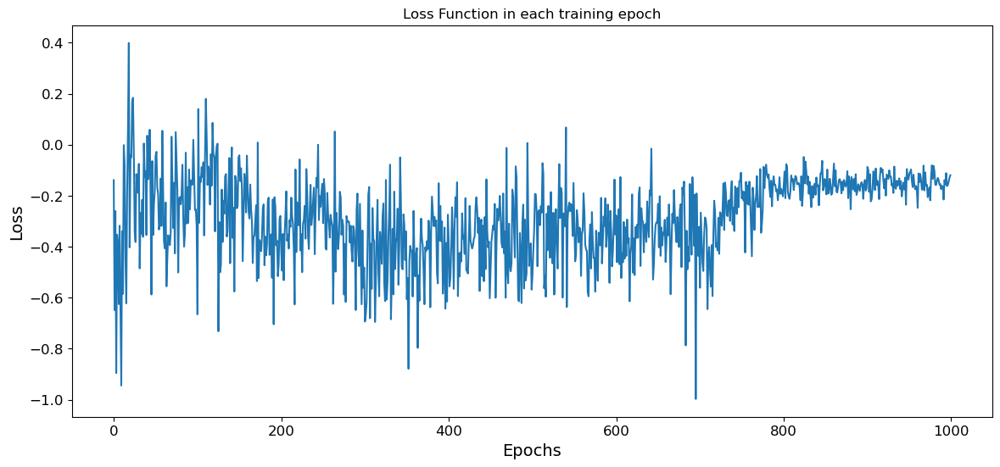

In [16]:
plt.figure(figsize=(14,6))
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.title('Loss Function in each training epoch')
plt.plot(epoch_loss)

La mejora apreciada en la función de pérdidas es muy leve, a pesar de que se han realizado 1000 épocas de entrenamiento. Probablemente, más épocas de entrenamiento arrojarían un modelo mucho mejor; sin embargo, no es computacionalmente realista para nosotros entrenar modelos más complejos que este.

### Actor Critic Methods: A2C

A continuación, se probarán los métodos de Actor-Critic. Estos métodos combinan las ideas de los métodos de valores Q y los métodos de gradiente de políticas. En el caso de A2C, se entrenarán dos redes neuronales. En palabras simples, el primero se utiliza para decidir qué acción tomar (Actor), y el otro evalúa qué tan buena fue esa decisión de acción (Crítico). Veamos qué tan bien funciona este método en el problema de los humanoides.

In [17]:
from stable_baselines3 import A2C

In [18]:
# Model creation and learning

model = A2C('MlpPolicy', env, verbose=1)
model.learn(total_timesteps=100000)    # 10000 steps for learning

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


c:\Users\LOLI\anaconda3\envs\ML\Lib\site-packages\glfw\__init__.py:914: GLFWError: (65537) b'The GLFW library is not initialized'
  warnings.warn(message, GLFWError)


------------------------------------
| rollout/              |          |
|    ep_len_mean        | 20.3     |
|    ep_rew_mean        | 98.8     |
| time/                 |          |
|    fps                | 365      |
|    iterations         | 100      |
|    time_elapsed       | 1        |
|    total_timesteps    | 500      |
| train/                |          |
|    entropy_loss       | -24      |
|    explained_variance | 0.579    |
|    learning_rate      | 0.0007   |
|    n_updates          | 99       |
|    policy_loss        | 357      |
|    std                | 0.991    |
|    value_loss         | 243      |
------------------------------------
------------------------------------
| rollout/              |          |
|    ep_len_mean        | 21.3     |
|    ep_rew_mean        | 103      |
| time/                 |          |
|    fps                | 361      |
|    iterations         | 200      |
|    time_elapsed       | 2        |
|    total_timesteps    | 1000     |
|

In [19]:
# Testing the results with 10 episodes. There is no training in this loop, it is only used to test the model
import numpy as np
episodes = 10
rew=[]

for ep in range(episodes):
    obs = env.reset()
    obs=obs[0]
    done = False
    ep_rewards=[]
    while not done:
        action, _states = model.predict(obs)
        obs, rewards, done,tr, info = env.step(action)
        env.render()
        ep_rewards.append(rewards)
    print(f'Episode {ep}: Mean Reward:{np.mean(ep_rewards)}')
    rew.append(np.mean(ep_rewards))

Episode 0: Mean Reward:4.897182996025556
Episode 1: Mean Reward:4.677571173635943
Episode 2: Mean Reward:4.614658765845816
Episode 3: Mean Reward:4.967672727243525
Episode 4: Mean Reward:4.956918018652156
Episode 5: Mean Reward:4.794397132576827
Episode 6: Mean Reward:4.674916763370827
Episode 7: Mean Reward:4.8481818186118675
Episode 8: Mean Reward:4.347516944889714
Episode 9: Mean Reward:4.901318943543152


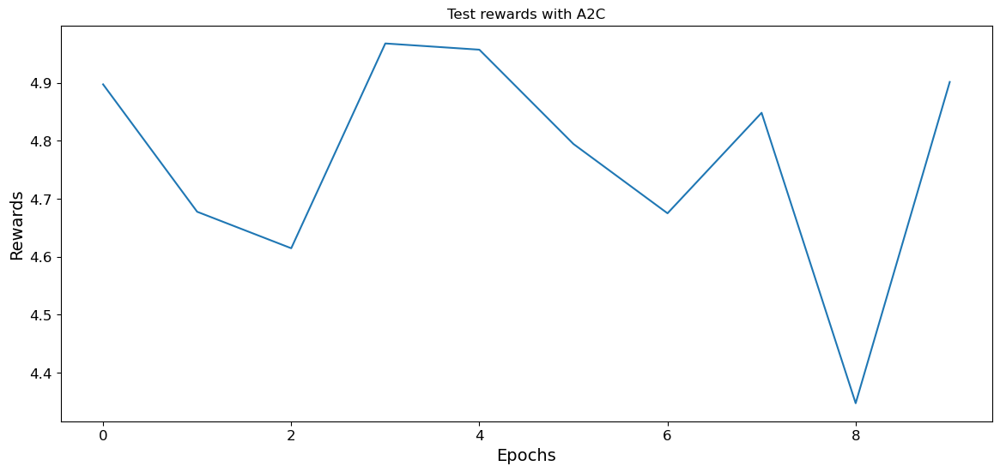

In [20]:
import matplotlib.pyplot as plt
plt.figure(figsize=(14,6))
plt.xlabel('Epochs')
plt.ylabel('Rewards')

plt.title('Test rewards with A2C')
plt.plot(rew)

### TD3

Por último, para intentar conseguir una mejora en el problema del humanoide, se plantea el uso del algoritmo de RL más complejo visto en clase: TD3. En este modelo ideado para mejorar inestabilidad y la dependencia de correctos hiperparámetros del Deep Deterministic Policy Gradient, se plantea una mejora al modelo DDPG en el que se utilizan dos redes críticas, actualizaciones retrasadas del actor y regularización del ruido de acción.   

Debido a la complejidad de estos métodos, se programan usando abstracciones de ``stable_baselines3``, que permiten un entrenamiento más fácil y cómodo a expensas de una menor personalización.

In [1]:
import gymnasium as gym
from stable_baselines3 import TD3

env = gym.make('Humanoid-v4', render_mode = 'human')
obs = env.reset()

if isinstance(obs, tuple):
    obs = obs[0]  # Si es una tupla, tomar solo la observación

model = TD3('MlpPolicy', env, verbose=1)
model.learn(total_timesteps=150000)

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 25.5     |
|    ep_rew_mean     | 125      |
| time/              |          |
|    episodes        | 4        |
|    fps             | 56       |
|    time_elapsed    | 1        |
|    total_timesteps | 102      |
| train/             |          |
|    critic_loss     | 80.4     |
|    learning_rate   | 0.001    |
|    n_updates       | 1        |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20.9     |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 8        |
|    fps             | 36       |
|    time_elapsed    | 4        |
|    total_timesteps | 167      |
| train/             |          |
|    actor_loss      | -3.11    |
|    critic_loss     | 4.03     |
|    learning_rate   |

In [2]:
episodes = 2500
total_rewards = []

for ep in range(episodes):
    obs = env.reset()
    if isinstance(obs, tuple):
        obs = obs[0]  # Asegurarse de que obs sea solo la observación

    done = False
    total_reward = 0
    
    while not done:
        action, _states = model.predict(obs, deterministic=True)
        step_result = env.step(action)  # Capturar todo el resultado en una variable
        obs, rewards, done, info = step_result[:4]  # Desempaquetar los primeros cuatro elementos
        env.render()
        total_reward += rewards
    
    total_rewards.append(total_reward)
    print(f"Episode {ep}: Total Reward = {total_reward}")

Episode 0: Total Reward = 61.63362148121943
Episode 1: Total Reward = 56.53987407458883
Episode 2: Total Reward = 56.66802998450208
Episode 3: Total Reward = 61.62705876593293
Episode 4: Total Reward = 61.264037441229355
Episode 5: Total Reward = 56.68369451616973
Episode 6: Total Reward = 56.64513867045171
Episode 7: Total Reward = 61.47053598673744
Episode 8: Total Reward = 61.62167991604589
Episode 9: Total Reward = 61.519209026510396
Episode 10: Total Reward = 56.603373712637
Episode 11: Total Reward = 61.30577909958393
Episode 12: Total Reward = 56.576653208709644
Episode 13: Total Reward = 56.654867185614954
Episode 14: Total Reward = 61.54399544704919
Episode 15: Total Reward = 56.960530311766476
Episode 16: Total Reward = 56.78113566220231
Episode 17: Total Reward = 61.639443792520204
Episode 18: Total Reward = 56.58569238294954
Episode 19: Total Reward = 56.72659564828234
Episode 20: Total Reward = 56.64043762602236
Episode 21: Total Reward = 56.76340918020476
Episode 22: Tota

In [ ]:
# Visualización de los resultados
plt.figure(figsize=(10, 6))
plt.plot(total_rewards, label="Recompensas", color='blue')
plt.xlabel("Episodio", fontsize=14)
plt.ylabel("Suma de recompensas", fontsize=14)
plt.legend(loc='upper left')

# Crear un eje secundario para el valor de epsilon
# ax = plt.gca().twinx()
# ax.plot(epsilons, label="Epsilon", color='red')
# ax.set_ylabel("Epsilon", fontsize=14)
# ax.legend(loc='upper right')

plt.title("Evolución de Recompensas y Epsilon a lo largo de los episodios", fontsize=16)
plt.show()

In [26]:
env.close()

Como podemos ver, ...

# FIN